
# **CLIMATOLOGIA DE PRECIPITAÇÃO**
---


- CHIRPS `MENSAL`
1. Site: https://catalog.data.gov/dataset/chirps-version-2-0-precipitation-global-0-05a-monthly-1981-present
2. url dos dados: https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05
3. base de dados completa: https://coastwatch.pfeg.noaa.gov/erddap/index.html
---

- MERGE `DIÁRIO`

1. Site: http://ftp.cptec.inpe.br/modelos/tempo/MERGE/
2. url dos dados: http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/
3. Informações: http://ftp.cptec.inpe.br/modelos/tempo/MERGE/READ_ME-MERGE.pdf


---


- Código realizado por: Enrique V. Mattos -- 13/04/2024 - enrique@unifei.edu.br


---



# **1° Passo:** Instalando as bibliotecas

In [1]:
# Instalando matplotlib, proplot e numpy
!pip install -q matplotlib==3.4.3
!pip install -q proplot==0.9.7
!pip install -q numpy==1.24.3

# Instalando salem
!pip install -q salem==0.3.9

# Instalando Xarray e suas dependências: https://docs.xarray.dev/en/stable/getting-started-guide/installing.html
!pip install -q xarray dask netCDF4 bottleneck

# Instalando rasterio, pyproj e geopandas
!pip install -q rasterio pyproj geopandas

# Instalando a Pygrib
!pip install -q pygrib

# foi usado devido ao pygrib não funcionar com a versão padrão do colab
!pip install -U numpy

# Instalando cartopy
!pip uninstall shapely --yes
!pip install -q shapely cartopy==0.21.1 --no-binary shapely --no-binary cartopy

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mizani 0.9.3 requires matplotlib>=3.5.0, but you have matplotlib 3.4.3 which is incompatible.
pandas-stubs 2.0.3.230814 requires numpy>=1.25.0; python_version >= "3.9", but you have numpy 1.24.3 which is incompatible.
plotnine 0.12.4 requires matplotlib>=3.6.0, but you have matplotlib 3.4.3 which is incompatible.
  Using cached numpy-1.26.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.3
    Uninstalling numpy-1.24.3:
      Successfully uninstalled numpy-1.24.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mizani 0.9.3 requires matplotlib>=3.5.0, but you have matplotlib 3.4.3 which is incompa

- Chegando aqui, será necessário fazer a `Reinicialização do Ambiente de Execução`. Para isto, você deverá acessar `Ambiente de execução`, localizado na barra de ferramentas e clicar em `Reiniciar Sessão`. Como indicado na imagem abaixo.

- Em seguida você deverá rodar novamente a célula anterior de instalações, de forma que as bibliotecas sejam instaladas novamente.

- Isso é necessário tanto para poder usar sem problemas o `Proplot` quanto o `CartoPy` na nossa sessão do Colab. Então a partir desse ponto não teremos mais que nos preocupar com a preparação do ambiente virtual.

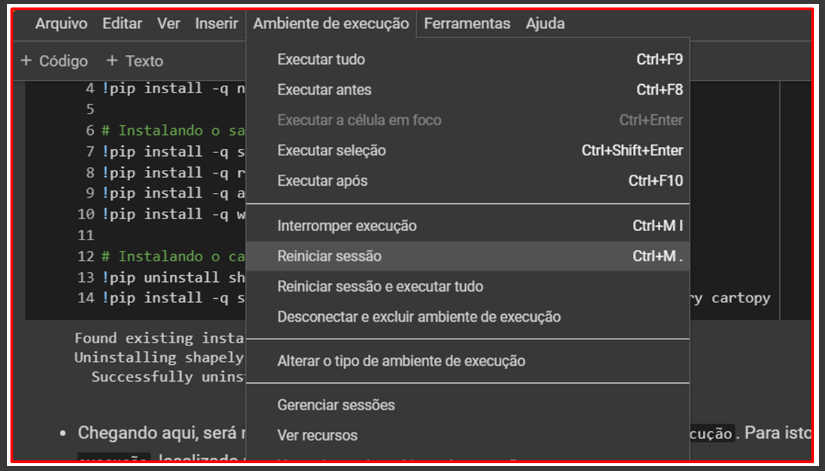

# **2° Passo:** Importando bibliotecas

In [30]:
import xarray as xr
import time
import proplot as pplt
import salem
import matplotlib
import cartopy.io.shapereader as shpreader
import cartopy.crs as ccrs
import numpy as np
import calendar
import matplotlib.pyplot as plt
from datetime import datetime
import pandas as pd
import pygrib
import scipy.ndimage
import os

import warnings
warnings.filterwarnings("ignore")

# Exemplo de Leitura dos dados

In [31]:
%%time
# área e período dos dados
lon_min, lon_max , lat_min, lat_max, time_min, time_max = -51.0, -39.8, -22.9, -14.2, '1992-01-01', '2022-12-31'

# leitura do dado
chuva_por_mes = xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')

# recorta para região
chuva_por_mes = chuva_por_mes.sel(longitude=slice(lon_min, lon_max),
                                  latitude=slice(lat_min, lat_max))\
                             .sel(time=slice(time_min, time_max))

# mostra o dado
chuva_por_mes

CPU times: user 60.6 ms, sys: 10.8 ms, total: 71.3 ms
Wall time: 2.99 s


<xarray.Dataset>
Dimensions:    (time: 372, latitude: 174, longitude: 224)
Coordinates:
  * time       (time) datetime64[ns] 1992-01-01 1992-02-01 ... 2022-12-01
  * latitude   (latitude) float32 -22.88 -22.83 -22.77 ... -14.33 -14.28 -14.23
  * longitude  (longitude) float32 -50.98 -50.93 -50.88 ... -39.93 -39.88 -39.82
Data variables:
    precip     (time, latitude, longitude) float32 ...
Attributes: (12/31)
    acknowledgements:          The Climate Hazards Group InfraRed Precipitati...
    cdm_data_type:             Grid
    Conventions:               CF-1.6, COARDS, ACDD-1.3
    creator_email:             pete@geog.ucsb.edu
    creator_name:              Pete Peterson
    creator_type:              person
    ...                        ...
    summary:                   This dataset has monthly averages of the Clima...
    time_coverage_end:         2024-02-01T00:00:00Z
    time_coverage_start:       1981-01-01T00:00:00Z
    title:                     CHIRPS Version 2.0, Precipitation, Global, 0.0...
    version:                   2.0
    Westernmost_Easting:       -179.975

# Gráficos básicos

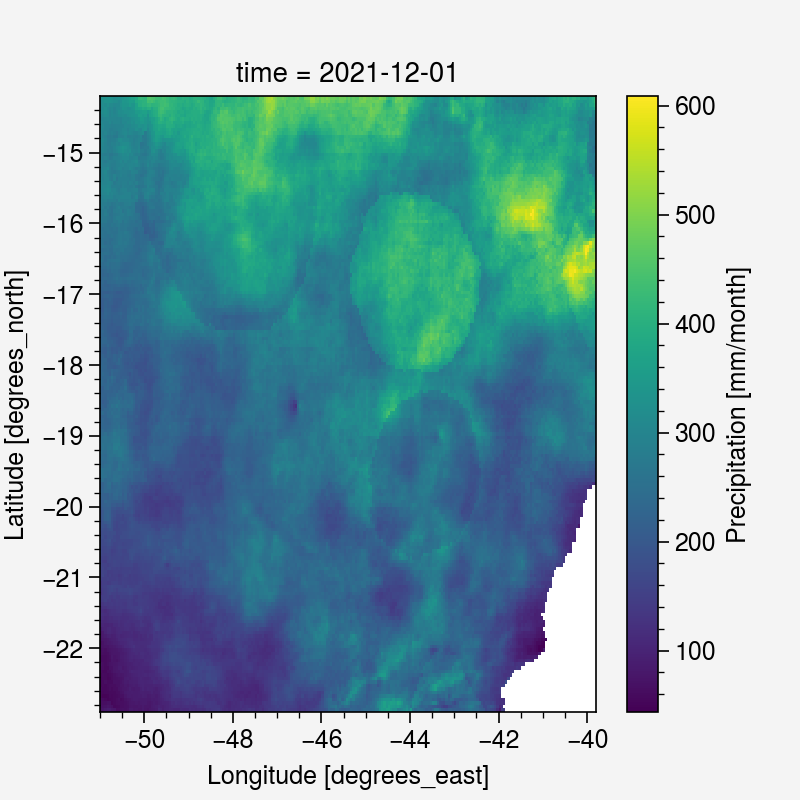

In [32]:
# selecionando o mês pelo NOME
chuva_por_mes['precip'].loc['2021-12-01T00:00:00.000000000'].plot()

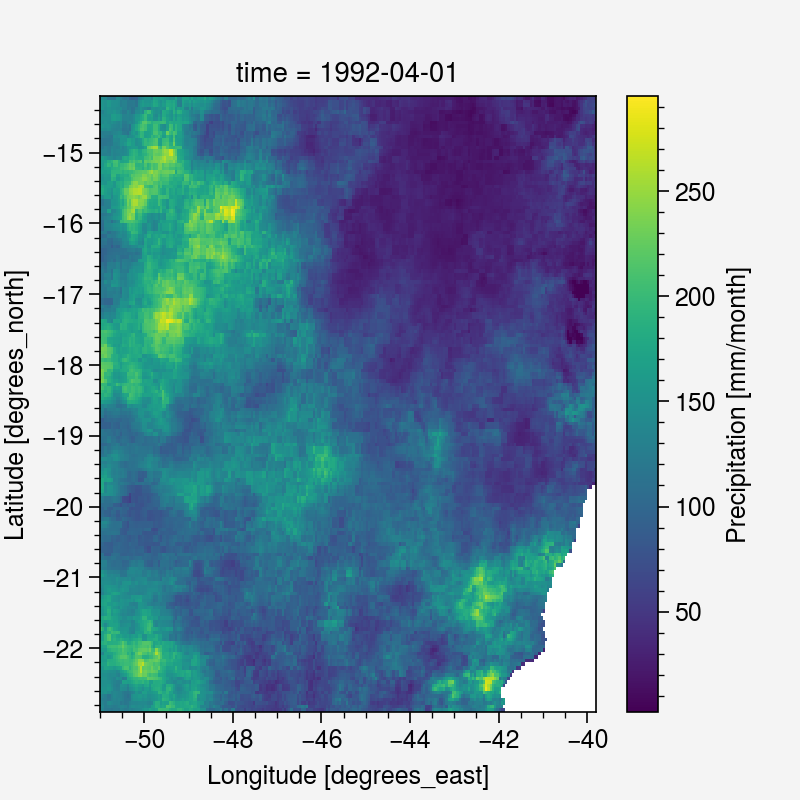

In [33]:
# selecionando o mês pelo ÍNDICE
chuva_por_mes['precip'].isel(time=3).plot()

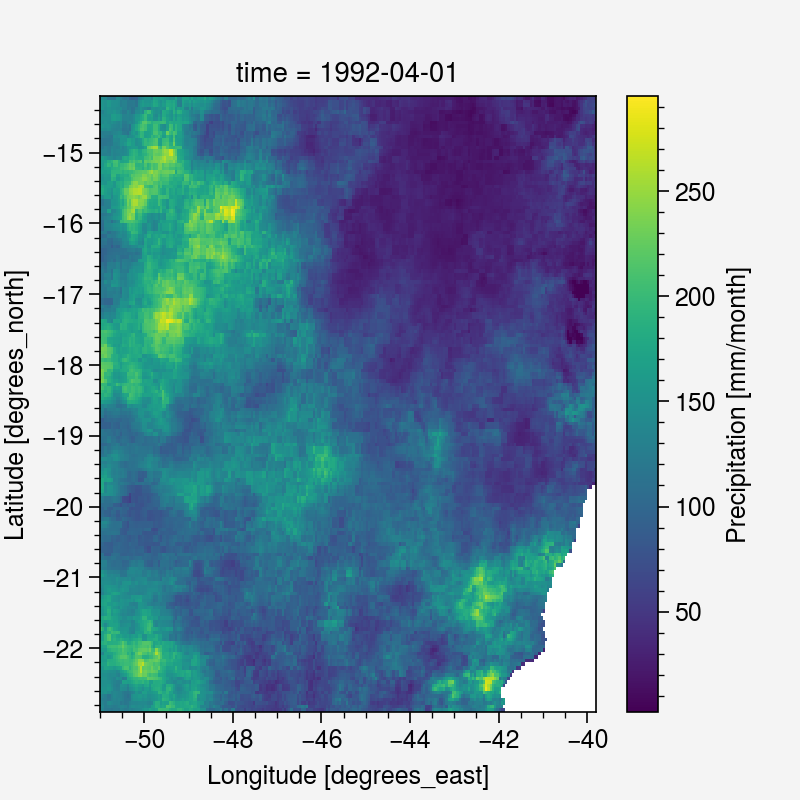

In [34]:
# selecionando o mês pelo ÍNDICE da matriz
chuva_por_mes['precip'][3, :, :].plot()

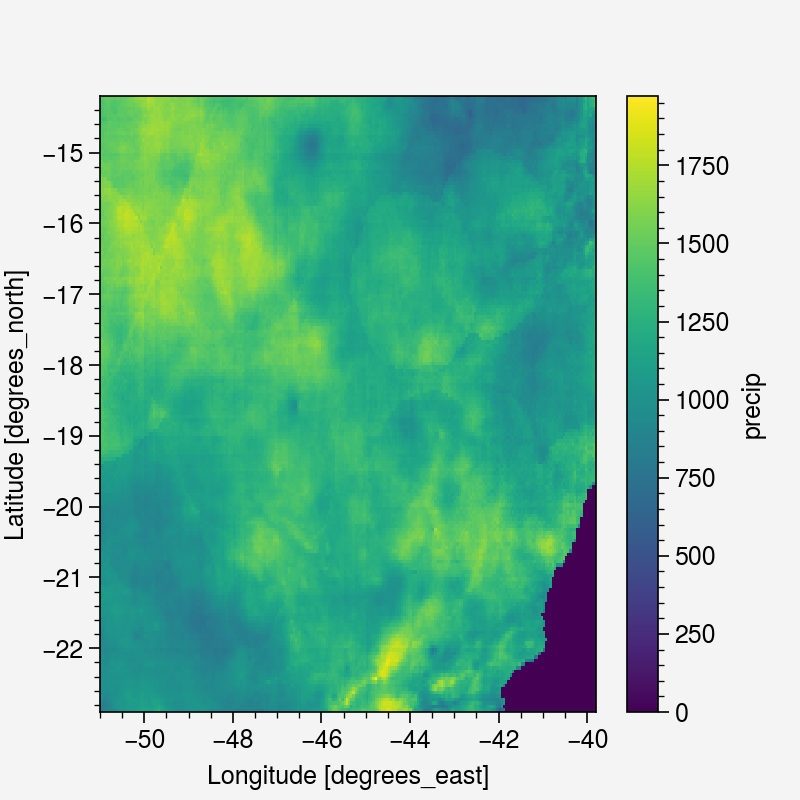

In [35]:
# fazendo uma soma no tempo
chuva_por_mes['precip'].loc['2021-01-01': '2021-12-31'].sum(dim='time').plot()

# Carrega shapefiles

In [36]:
# url dos shapefiles
url = 'https://github.com/evmpython/shapefile/raw/main/'

# define local dos shapefiles
roi = 'brasil'
#roi, sigla_estado = 'estado', 'MG'

if roi == 'brasil':
    url_filename = f'{url}brasil/BRAZIL.shp'
else:
    url_filename = f'{url}UFs/{sigla_estado}/{sigla_estado}_UF_2019.shp'

# leitura do shapefile com a biblioteca SALEM
shp = salem.read_shapefile(url_filename)

# período dos dados
anoi, anof = '2018', '2023'

# seleciona os limites da imagem
lonmin, lonmax, latmin, latmax = float(shp['min_x']), float(shp['max_x']), float(shp['min_y']), float(shp['max_y'])

# define melhor os limites do Brasil
if roi=='brasil': lonmin, lonmax, latmin, latmax = -75.0, -33.0, -35.0, 7.0

# mostra os limites
print(lonmin, lonmax)
print(latmin, latmax)

-75.0 -33.0
-35.0 7.0


# **PARTE 1)**:  `ANUAL`  - Mapa para 1 ano

## Cálculos

In [14]:
%%time
# leitura do dado
chuva_por_mes = xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')\
                  .sel(time=slice(f'{anoi}-01-01', f'{anof}-12-31'))\
                  .sel(longitude=slice(lonmin, lonmax), latitude=slice(latmin, latmax))

# reamostra o dado
chuva_por_ano = chuva_por_mes['precip'].groupby('time.year').sum('time')

# recorta o dado para região
chuva_por_ano = chuva_por_ano.salem.roi(shape=shp)

# mostra o dado
chuva_por_ano

CPU times: user 6.01 s, sys: 1.45 s, total: 7.46 s
Wall time: 59.5 s


<xarray.DataArray 'precip' (year: 6, latitude: 840, longitude: 840)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
  * year       (year) int64 2018 2019 2020 2021 2022 2023
Attributes:
    colorBarMaximum:  400.0
    colorBarMinimum:  0.0
    ioos_category:    Meteorology
    long_name:        Precipitation
    standard_name:    lwe_precipitation_rate
    time_step:        month
    units:            mm/month
    pyproj_srs:       +proj=longlat +datum=WGS84 +no_defs

CPU times: user 6.11 s, sys: 1.85 s, total: 7.96 s
Wall time: 58.6 s


<xarray.DataArray 'precip' (year: 6, latitude: 840, longitude: 840)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
  * year       (year) int64 2018 2019 2020 2021 2022 2023
Attributes:
    colorBarMaximum:  400.0
    colorBarMinimum:  0.0
    ioos_category:    Meteorology
    long_name:        Precipitation
    standard_name:    lwe_precipitation_rate
    time_step:        month
    units:            mm/month
    pyproj_srs:       +proj=longlat +datum=WGS84 +no_defs

In [13]:
chuva_por_mes

<xarray.Dataset>
Dimensions:    (time: 72, latitude: 840, longitude: 840)
Coordinates:
  * time       (time) datetime64[ns] 2018-01-01 2018-02-01 ... 2023-12-01
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
Data variables:
    precip     (time, latitude, longitude) float32 ...
Attributes: (12/31)
    acknowledgements:          The Climate Hazards Group InfraRed Precipitati...
    cdm_data_type:             Grid
    Conventions:               CF-1.6, COARDS, ACDD-1.3
    creator_email:             pete@geog.ucsb.edu
    creator_name:              Pete Peterson
    creator_type:              person
    ...                        ...
    summary:                   This dataset has monthly averages of the Clima...
    time_coverage_end:         2024-02-01T00:00:00Z
    time_coverage_start:       1981-01-01T00:00:00Z
    title:                     CHIRPS Version 2.0, Precipitation, Global, 0.0...
    version:                   2.0
    Westernmost_Easting:       -179.975

## Gráfico

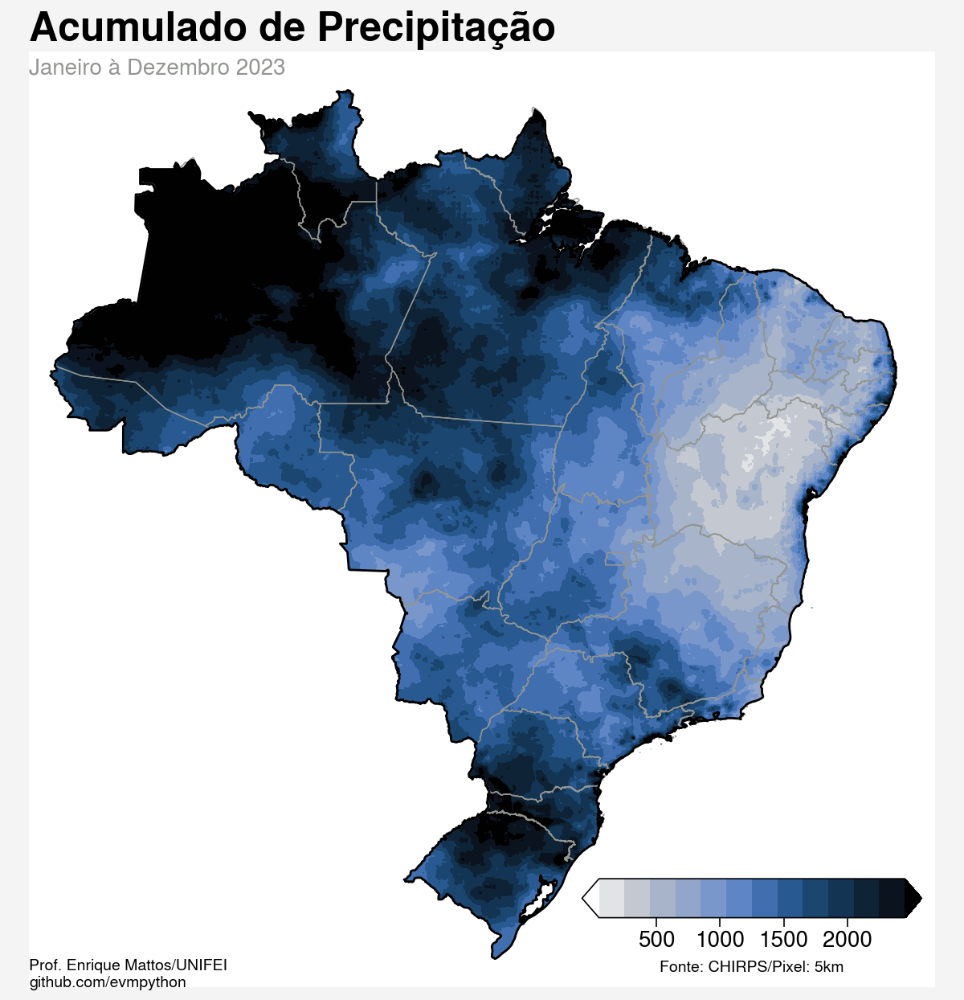

In [11]:
# cria moldura da figura
fig, ax = pplt.subplots(axwidth=6, tight=True, proj='pcarree')

# indice do ano
ind_ano = 5
ano = str(chuva_por_ano['year'][ind_ano].values)[0:4]

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          labels=False, latlines=5, lonlines=10,
          latlim=(latmin, latmax), lonlim=(lonmin, lonmax),
          title=f'Acumulado de Precipitação',
          titleloc='l',
          titleweight='bold',
          titlecolor='black',
          small='20px', large='25px',
          linewidth=0, grid=False)

# plota subtítulo
ax.text(lonmin, latmax-1.0, f'Janeiro à Dezembro {ano}', color='grey', fontsize=10)

# plota mapa
map1 = ax.contourf(chuva_por_ano['longitude'],
                   chuva_por_ano['latitude'],
                   chuva_por_ano[ind_ano,:,:],
                   extend='both',
                   cmap='oslo_r',
                   vmin=50, vmax=2500,
                   levels=pplt.arange(50, 2500, 200),
                   colorbar='best',
                   colorbar_kw={'label': 'Fonte: CHIRPS/Pixel: 5km',
                                'length': 18,
                                'frameon': False,
                                'ticklabelsize': 10,
                                'labelsize': 7,
                                'width': 2,
                                'ticks': 500})
# plota contornos
if roi == 'brasil':
    # plota contorno dos Estados
    estados_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/estados_do_brasil/BR_UF_2019.shp')
    estados_brasil.plot(edgecolor='gray', facecolor='none', linewidth=0.5, alpha=1, ax=ax)

    # plota contorno do Brasil
    contorno_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/brasil/BRAZIL.shp')
    contorno_brasil.plot(edgecolor='black', facecolor='none', linewidth=1.0, alpha=1, ax=ax)
else:
  # plota contorno do Estado
  shp.plot(edgecolor='black', facecolor='none', linewidth=1.2, alpha=1, ax=ax)

# informação na figura
ax.annotate('Prof. Enrique Mattos/UNIFEI\ngithub.com/evmpython', xy=(lonmin,latmin), fontsize=7, color='black')

# salva figura
fig.save(f'Fig_1_chirps_{ano}.png', dpi=300)

# **PARTE 2)**:  `ANUAL`  - Mapa para vários anos

## Cálculos

In [37]:
%%time
# leitura do dado
chuva_por_mes = xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')\
                  .sel(time=slice(f'{anoi}-01-01', f'{anof}-12-31'))\
                  .sel(longitude=slice(lonmin, lonmax), latitude=slice(latmin, latmax))

# reamostra o dado
chuva_por_ano = chuva_por_mes['precip'].groupby('time.year').sum('time')

# recorta o dado para região
chuva_por_ano = chuva_por_ano.salem.roi(shape=shp)

# mostra o dado
chuva_por_ano

CPU times: user 6.35 s, sys: 1.35 s, total: 7.7 s
Wall time: 1min 4s


<xarray.DataArray 'precip' (year: 6, latitude: 840, longitude: 840)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
  * year       (year) int64 2018 2019 2020 2021 2022 2023
Attributes:
    colorBarMaximum:  400.0
    colorBarMinimum:  0.0
    ioos_category:    Meteorology
    long_name:        Precipitation
    standard_name:    lwe_precipitation_rate
    time_step:        month
    units:            mm/month
    pyproj_srs:       +proj=longlat +datum=WGS84 +no_defs

## Gráfico

Processando o ano: .... 2018
Processando o ano: .... 2019
Processando o ano: .... 2020
Processando o ano: .... 2021
Processando o ano: .... 2022
Processando o ano: .... 2023


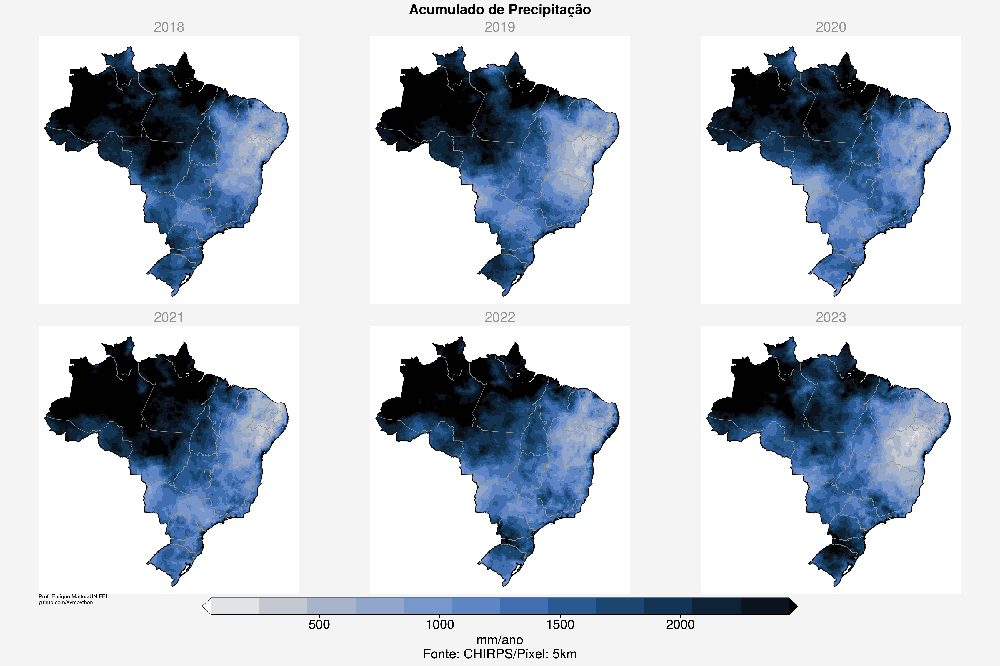

In [38]:
# cria a moldura da figura
fig, ax = pplt.subplots(figsize=(18, 12), nrows=2, ncols=3, tight=True, proj='pcarree', sharex=True, sharey=True)

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          labels=False, latlines=5, lonlines=10,
          latlim=(latmin, latmax), lonlim=(lonmin, lonmax),
          suptitle=f'Acumulado de Precipitação',
          small='20px', large='25px',
          linewidth=0, grid=False)

# loop dos anos
for i in range(len(chuva_por_ano)):

  # extrai o nome do ano
  ano = str(chuva_por_ano['year'][i].values)[0:4]

  # exibe na tela o ano que esta sendo processado
  print(f'Processando o ano: .... {ano}')

  # plota figura
  map1 = ax[i].contourf(chuva_por_ano['longitude'],
                        chuva_por_ano['latitude'],
                        chuva_por_ano[i,:,:],
                        cmap='oslo_r',
                        vmin=50, vmax=2500,
                        levels=pplt.arange(50, 2500, 200),
                        extend='both')

  # plota titulo de cada figura
  if(i == 0): ax[i].format(title=ano, labels = False, titleloc='c', titlecolor='grey')
  if(i == 2): ax[i].format(title=ano, labels = False, titleloc='c', titlecolor='grey')
  if(i == 1): ax[i].format(title=ano, labels = False, titleloc='c', titlecolor='grey')
  if(i == 3): ax[i].format(title=ano, labels = False, titleloc='c', titlecolor='grey')
  if(i == 4): ax[i].format(title=ano, labels = False, titleloc='c', titlecolor='grey')
  if(i == 5): ax[i].format(title=ano, labels = False, titleloc='c', titlecolor='grey')

  # plota contornos
  if roi == 'brasil':
    # plota contorno dos Estados
    estados_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/estados_do_brasil/BR_UF_2019.shp')
    estados_brasil.plot(edgecolor='gray', facecolor='none', linewidth=0.5, alpha=1, ax=ax[i])

    # plota contorno do Brasil
    contorno_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/brasil/BRAZIL.shp')
    contorno_brasil.plot(edgecolor='black', facecolor='none', linewidth=1.0, alpha=1, ax=ax[i])
  else:
    # plota contorno do Estado
    shp.plot(edgecolor='black', facecolor='none', linewidth=1.2, alpha=1, ax=ax[i])

# informação na figura
ax[3].annotate('Prof. Enrique Mattos/UNIFEI\ngithub.com/evmpython', xy=(lonmin, latmin-1.5), fontsize=7, color='black')

# plota barra de cores da figura
fig.colorbar(map1, loc='b', label='mm/ano\nFonte: CHIRPS/Pixel: 5km', ticks=500, ticklabelsize=17, labelsize=17, space=0.5, length=0.60, width=0.3)

# salva figura
fig.savefig(f'Fig_2_chirps_varios_anos_{anoi}_{anof}.jpg', transparent=True, dpi=300, bbox_inches="tight", pad_inches=0.1)

#**PARTE 3)**:  `ANUAL`  - Mapa médio

## Cálculos

In [22]:
%%time
# leitura do dado
chuva_por_mes = xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')\
                  .sel(time=slice(f'{anoi}-01-01', f'{anof}-12-31'))\
                  .sel(longitude=slice(lonmin, lonmax), latitude=slice(latmin, latmax))

# reamostra o dado
chuva_por_ano = chuva_por_mes['precip'].groupby('time.year').sum('time')

# reamostra o dado
chuva_media_anual = chuva_por_ano.mean(dim='year')

# recorta o dado para região
chuva_media_anual = chuva_media_anual.salem.roi(shape=shp)

# mostra o dado
chuva_media_anual

CPU times: user 6.08 s, sys: 1.32 s, total: 7.41 s
Wall time: 59.8 s


<xarray.DataArray 'precip' (latitude: 840, longitude: 840)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
Attributes:
    pyproj_srs:  +proj=longlat +datum=WGS84 +no_defs

## Gráfico

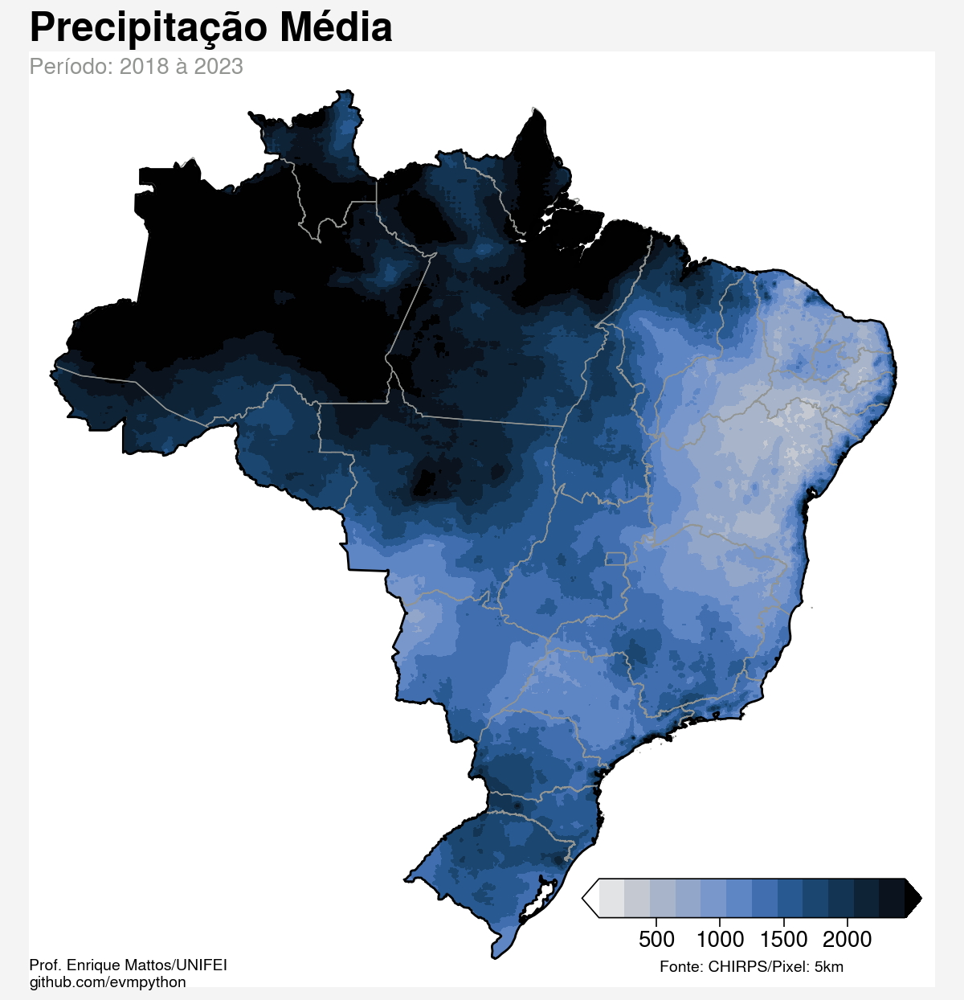

In [23]:
# cria moldura da figura
fig, ax = pplt.subplots(axwidth=6, tight=True, proj='pcarree')

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          labels=False, latlines=5, lonlines=10,
          latlim=(latmin, latmax), lonlim=(lonmin, lonmax),
          title=f'Precipitação Média',
          titleloc='l',
          titleweight='bold',
          titlecolor='black',
          small='20px', large='25px',
          linewidth=0, grid=False)

# plota subtítulo
ax.text(lonmin, latmax-1.0, f'Período: {anoi} à {anof}', color='grey', fontsize=10)

# plota mapa
map1 = ax.contourf(chuva_media_anual['longitude'],
                   chuva_media_anual['latitude'],
                   chuva_media_anual[:,:],
                   extend='both',
                   cmap='oslo_r',
                   vmin=50, vmax=2500,
                   levels=pplt.arange(50, 2500, 200),
                   colorbar='best',
                   colorbar_kw={'label': 'Fonte: CHIRPS/Pixel: 5km',
                                'length': 18,
                                'frameon': False,
                                'ticklabelsize': 10,
                                'labelsize': 7,
                                'width': 2,
                                'ticks': 500})
# plota contornos
if roi == 'brasil':
    # plota contorno dos Estados
    estados_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/estados_do_brasil/BR_UF_2019.shp')
    estados_brasil.plot(edgecolor='gray', facecolor='none', linewidth=0.5, alpha=1, ax=ax)

    # plota contorno do Brasil
    contorno_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/brasil/BRAZIL.shp')
    contorno_brasil.plot(edgecolor='black', facecolor='none', linewidth=1.0, alpha=1, ax=ax)
else:
  # plota contorno do Estado
  shp.plot(edgecolor='black', facecolor='none', linewidth=1.2, alpha=1, ax=ax)

# informação na figura
ax.annotate('Prof. Enrique Mattos/UNIFEI\ngithub.com/evmpython', xy=(lonmin,latmin), fontsize=7, color='black')

# salva figura
fig.save(f'Fig_3_chirps_media_anual_{anoi}_{anof}.png', dpi=300)

# **PARTE 4)**:  `SAZONAL`  - Mapa para 1 ano

## Cálculos

In [39]:
# define o ano
ano = 2023

# leitura do dado
chuva_por_mes = xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')\
                  .sel(time=slice(f'{ano}-01-01', f'{ano}-12-31'))\
                  .sel(longitude=slice(lonmin, lonmax), latitude=slice(latmin, latmax))

# reamostra o dado
chuva_sazonal = chuva_por_mes['precip'].groupby("time.season").sum(dim="time")

# recorta o dado para região
chuva_sazonal  = chuva_sazonal.salem.roi(shape=shp)

# mostra o dado
chuva_sazonal

<xarray.DataArray 'precip' (season: 4, latitude: 840, longitude: 840)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    colorBarMaximum:  400.0
    colorBarMinimum:  0.0
    ioos_category:    Meteorology
    long_name:        Precipitation
    standard_name:    lwe_precipitation_rate
    time_step:        month
    units:            mm/month
    pyproj_srs:       +proj=longlat +datum=WGS84 +no_defs

## Gráfico

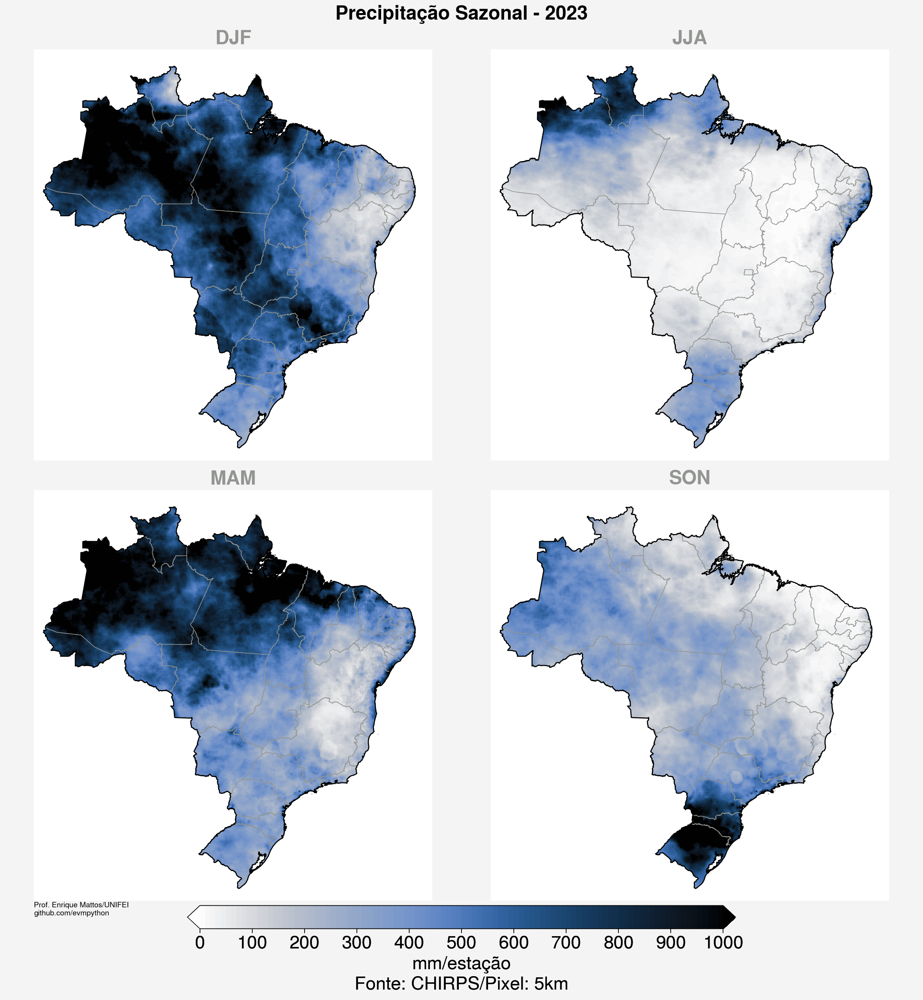

In [41]:
# cria a moldura da figura
fig, ax = pplt.subplots(figsize=(12,13), nrows=2, ncols=2, tight=True, proj='pcarree', sharex=True, sharey=True)

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          labels=False, latlines=5, lonlines=10,
          latlim=(latmin, latmax), lonlim=(lonmin, lonmax),
          suptitle=f'Precipitação Sazonal - {ano}',
          titleloc='c',
          titleweight='bold',
          titlecolor='black',
          small='20px', large='25px',
          linewidth=0, grid=False)

# loop das estações do ano
for s in range(len(chuva_sazonal)):

    # plota figura
    map1 = ax[s].contourf(chuva_sazonal['longitude'],
                          chuva_sazonal['latitude'],
                          chuva_sazonal[s,:,:],
                          cmap='oslo_r',
                          vmin=0, vmax=1000,
                          levels=pplt.arange(0, 1000, 10),
                          extend='both')

    # plota titulo de cada figura
    if(s == 0): ax[s].format(title=chuva_sazonal.season[s].values, titleloc='c', titlecolor='grey')
    if(s == 1): ax[s].format(title=chuva_sazonal.season[s].values, titleloc='c', titlecolor='grey')
    if(s == 2): ax[s].format(title=chuva_sazonal.season[s].values, titleloc='c', titlecolor='grey')
    if(s == 3): ax[s].format(title=chuva_sazonal.season[s].values, titleloc='c', titlecolor='grey')

    # plota contornos
    if roi == 'brasil':
        # plota contorno dos Estados
        estados_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/estados_do_brasil/BR_UF_2019.shp')
        estados_brasil.plot(edgecolor='gray', facecolor='none', linewidth=0.5, alpha=1, ax=ax[s])

        # plota contorno do Brasil
        contorno_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/brasil/BRAZIL.shp')
        contorno_brasil.plot(edgecolor='black', facecolor='none', linewidth=1.0, alpha=1, ax=ax[s])
    else:
        # plota contorno do Estado
        shp.plot(edgecolor='black', facecolor='none', linewidth=1.2, alpha=1, ax=ax[s])

# informação na figura
ax[2].annotate('Prof. Enrique Mattos/UNIFEI\ngithub.com/evmpython', xy=(lonmin, latmin-1.5), fontsize=7, color='black')

# plota barra de cores da figura
fig.colorbar(map1, loc='b', label='mm/estação\nFonte: CHIRPS/Pixel: 5km', ticks=100, ticklabelsize=17, labelsize=17, space=0.5, length=0.60, width=0.3)

# salva figura
fig.savefig(f'Fig_4_chirps_sazonal_{ano}.png', dpi=300)

# **PARTE 5)**:  `SAZONAL`  - Mapa médio

## Cálculos

In [42]:
# leitura do dado
chuva_por_mes = xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')\
                  .sel(time=slice(f'{anoi}-01-01', f'{anof}-12-31'))\
                  .sel(longitude=slice(lonmin, lonmax), latitude=slice(latmin, latmax))

# reamostra o dado
chuva_media_sazonal = chuva_por_mes['precip'].groupby("time.season").mean(dim="time")

# recorta o dado para região
chuva_media_sazonal  = chuva_media_sazonal.salem.roi(shape=shp)

# mostra o dado
chuva_media_sazonal

<xarray.DataArray 'precip' (season: 4, latitude: 840, longitude: 840)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    colorBarMaximum:  400.0
    colorBarMinimum:  0.0
    ioos_category:    Meteorology
    long_name:        Precipitation
    standard_name:    lwe_precipitation_rate
    time_step:        month
    units:            mm/month
    pyproj_srs:       +proj=longlat +datum=WGS84 +no_defs

## Gráfico

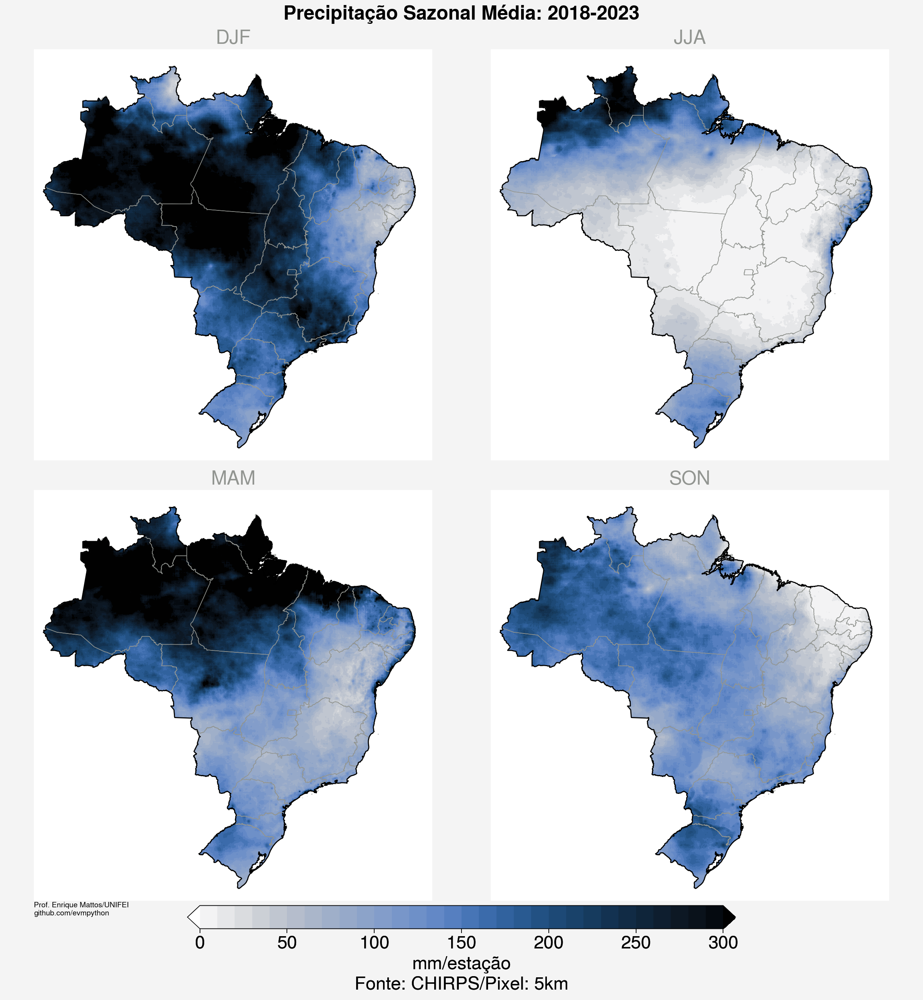

In [43]:
# cria a moldura da figura
fig, ax = pplt.subplots(figsize=(12,13), nrows=2, ncols=2, tight=True, proj='pcarree', sharex=True, sharey=True)

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          labels=False, latlines=5, lonlines=10,
          latlim=(latmin, latmax), lonlim=(lonmin, lonmax),
          suptitle=f'Precipitação Sazonal Média: {anoi}-{anof}',
          small='20px', large='25px',
          linewidth=0, grid=False)

# loop das estações do ano
for s in range(len(chuva_media_sazonal)):

    # plota figura
    map1 = ax[s].contourf(chuva_media_sazonal['longitude'],
                          chuva_media_sazonal['latitude'],
                          chuva_media_sazonal[s,:,:],
                          cmap='oslo_r',
                          vmin=0, vmax=300,
                          levels=pplt.arange(0, 300, 10),
                          extend='both')

    # plota titulo de cada figura
    if(s == 0): ax[s].format(title=chuva_media_sazonal.season[s].values, titleloc='c', titlecolor='grey')
    if(s == 1): ax[s].format(title=chuva_media_sazonal.season[s].values, titleloc='c', titlecolor='grey')
    if(s == 2): ax[s].format(title=chuva_media_sazonal.season[s].values, titleloc='c', titlecolor='grey')
    if(s == 3): ax[s].format(title=chuva_media_sazonal.season[s].values, titleloc='c', titlecolor='grey')

    # plota contornos
    if roi == 'brasil':
        # plota contorno dos Estados
        estados_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/estados_do_brasil/BR_UF_2019.shp')
        estados_brasil.plot(edgecolor='gray', facecolor='none', linewidth=0.5, alpha=1, ax=ax[s])

        # plota contorno do Brasil
        contorno_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/brasil/BRAZIL.shp')
        contorno_brasil.plot(edgecolor='black', facecolor='none', linewidth=1.0, alpha=1, ax=ax[s])
    else:
        # plota contorno do Estado
        shp.plot(edgecolor='black', facecolor='none', linewidth=1.2, alpha=1, ax=ax[s])

# informação na figura
ax[2].annotate('Prof. Enrique Mattos/UNIFEI\ngithub.com/evmpython', xy=(lonmin, latmin-1.5), fontsize=7, color='black')

# plota barra de cores da figura
fig.colorbar(map1, loc='b', label='mm/estação\nFonte: CHIRPS/Pixel: 5km', ticks=50, ticklabelsize=17, labelsize=17, space=0.5, length=0.60, width=0.3)

# salva figura
fig.savefig(f'Fig_5_chirps_media_sazonal_{anoi}_{anof}.jpg', dpi=300)

# **PARTE 6)**:  `MENSAL`  - Mapa para 1 ano

## Cálculos

In [44]:
# define o ano
ano = 2023

# leitura do dado
chuva_por_mes = xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')\
                  .sel(time=slice(f'{ano}-01-01', f'{ano}-12-31'))\
                  .sel(longitude=slice(lonmin, lonmax), latitude=slice(latmin, latmax))

# recorta o dado para região
chuva_por_mes = chuva_por_mes.salem.roi(shape=shp)

# mostra o dado
chuva_por_mes

<xarray.Dataset>
Dimensions:    (time: 12, latitude: 840, longitude: 840)
Coordinates:
  * time       (time) datetime64[ns] 2023-01-01 2023-02-01 ... 2023-12-01
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
Data variables:
    precip     (time, latitude, longitude) float32 nan nan nan ... nan nan nan
Attributes: (12/32)
    acknowledgements:          The Climate Hazards Group InfraRed Precipitati...
    cdm_data_type:             Grid
    Conventions:               CF-1.6, COARDS, ACDD-1.3
    creator_email:             pete@geog.ucsb.edu
    creator_name:              Pete Peterson
    creator_type:              person
    ...                        ...
    time_coverage_end:         2024-02-01T00:00:00Z
    time_coverage_start:       1981-01-01T00:00:00Z
    title:                     CHIRPS Version 2.0, Precipitation, Global, 0.0...
    version:                   2.0
    Westernmost_Easting:       -179.975
    pyproj_srs:                +proj=longlat +datum=WGS84 +no_defs

## Gráfico

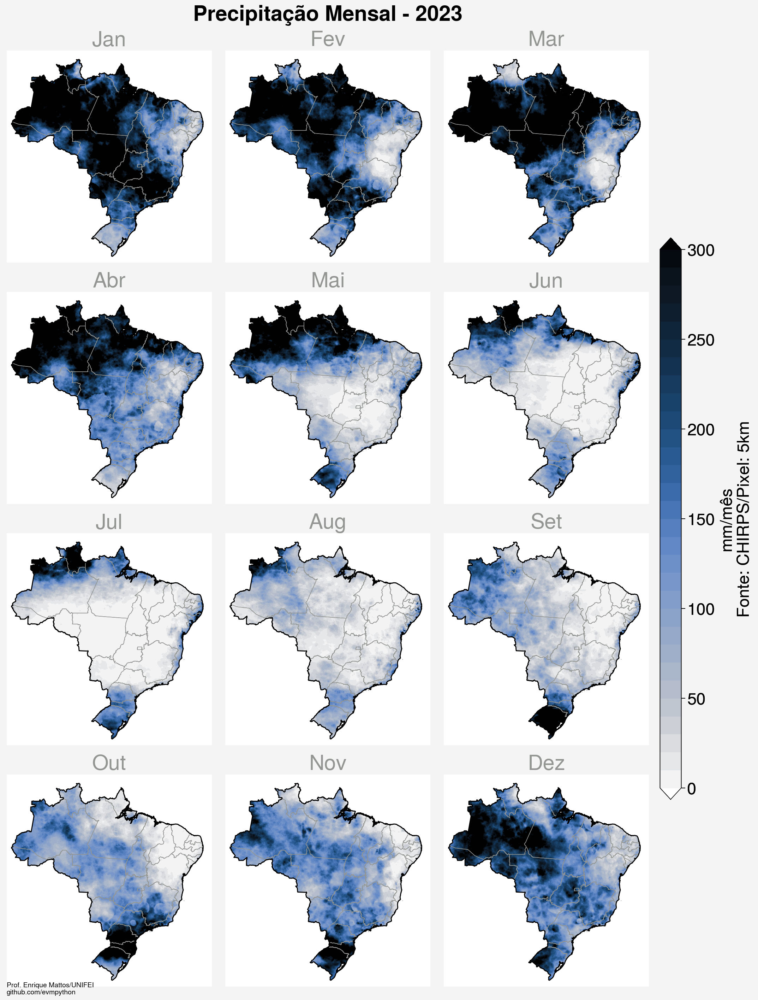

In [45]:
# cria a moldura da figura
fig, ax = pplt.subplots(ncols=3, nrows=4, axheight=3, tight=True, proj='pcarree', sharex=True, sharey=True)

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          labels=False,
          latlim=(latmin, latmax), lonlim=(lonmin, lonmax),
          suptitle=f'Precipitação Mensal - {ano}',
          small='25px', large='30px',
          linewidth=0, grid=False)

# nome do mês
nome_mes =  ['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 'Jul', 'Aug', 'Set', 'Out', 'Nov', 'Dez']

# loop dos meses
for m in np.arange(0, 12):

    # nome do mês
    mes = str(m+1).zfill(2)

    # plota figura
    if m == 0:
        map1 = ax[m].contourf(chuva_por_mes['longitude'],
                              chuva_por_mes['latitude'],
                              chuva_por_mes['precip'][m,:,:],
                              cmap='oslo_r',
                              vmin=0, vmax=300,
                              levels=pplt.arange(0, 300, 10),
                              extend='both')
    else:
        ax[m].contourf(chuva_por_mes['longitude'],
                       chuva_por_mes['latitude'],
                       chuva_por_mes['precip'][m,:,:],
                       cmap='oslo_r',
                       vmin=0, vmax=300,
                       levels=pplt.arange(0, 300, 10),
                       extend='both')

    # plota titulo de cada figura
    if (m==1 or m==2 or m==4 or m==5 or m==7 or m==8): ax[m].format(title = nome_mes[m], titleloc='c', titlecolor='grey')
    if (m==10 or m==11): ax[m].format(title = nome_mes[m], titleloc='c', titlecolor='grey')
    if (m==0 or m==3 or m==6): ax[m].format(title = nome_mes[m], titleloc='c', titlecolor='grey')
    if (m==9): ax[m].format(title = nome_mes[m], titleloc='c', titlecolor='grey')

    # plota contornos
    if roi == 'brasil':
        # plota contorno dos Estados
        estados_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/estados_do_brasil/BR_UF_2019.shp')
        estados_brasil.plot(edgecolor='gray', facecolor='none', linewidth=0.5, alpha=1, ax=ax[m])

        # plota contorno do Brasil
        contorno_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/brasil/BRAZIL.shp')
        contorno_brasil.plot(edgecolor='black', facecolor='none', linewidth=1.0, alpha=1, ax=ax[m])
    else:
        # plota contorno do Estado
        shp.plot(edgecolor='black', facecolor='none', linewidth=1.2, alpha=1, ax=ax[m])

# informação na figura
ax[9].annotate('Prof. Enrique Mattos/UNIFEI\ngithub.com/evmpython', xy=(lonmin, latmin-1.5), fontsize=7, color='black')

# plota barra de cores da figura
fig.colorbar(map1, loc='r', orientation='vertical', label='mm/mês\nFonte: CHIRPS/Pixel: 5km', ticks=50, ticklabelsize=17, labelsize=17, space=0.5, length=0.60, width=0.3)

# salva figura
fig.savefig(f'Fig_6_chirps_mensal_{ano}.jpg', dpi=300)

# **PARTE 7)**:  `MENSAL`  - Mapa médio

## Cálculos

In [46]:
# leitura do dado
chuva_por_mes = xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')\
                  .sel(time=slice(f'{anoi}-01-01', f'{anof}-12-31'))\
                  .sel(longitude=slice(lonmin, lonmax), latitude=slice(latmin, latmax))

# reamostra o dado
chuva_media_mensal = chuva_por_mes['precip'].groupby('time.month').mean(dim='time')

# recorta o dado para região
chuva_media_mensal = chuva_media_mensal.salem.roi(shape=shp)

# mostra o dado
chuva_media_mensal

<xarray.DataArray 'precip' (month: 12, latitude: 840, longitude: 840)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    colorBarMaximum:  400.0
    colorBarMinimum:  0.0
    ioos_category:    Meteorology
    long_name:        Precipitation
    standard_name:    lwe_precipitation_rate
    time_step:        month
    units:            mm/month
    pyproj_srs:       +proj=longlat +datum=WGS84 +no_defs

## Gráfico

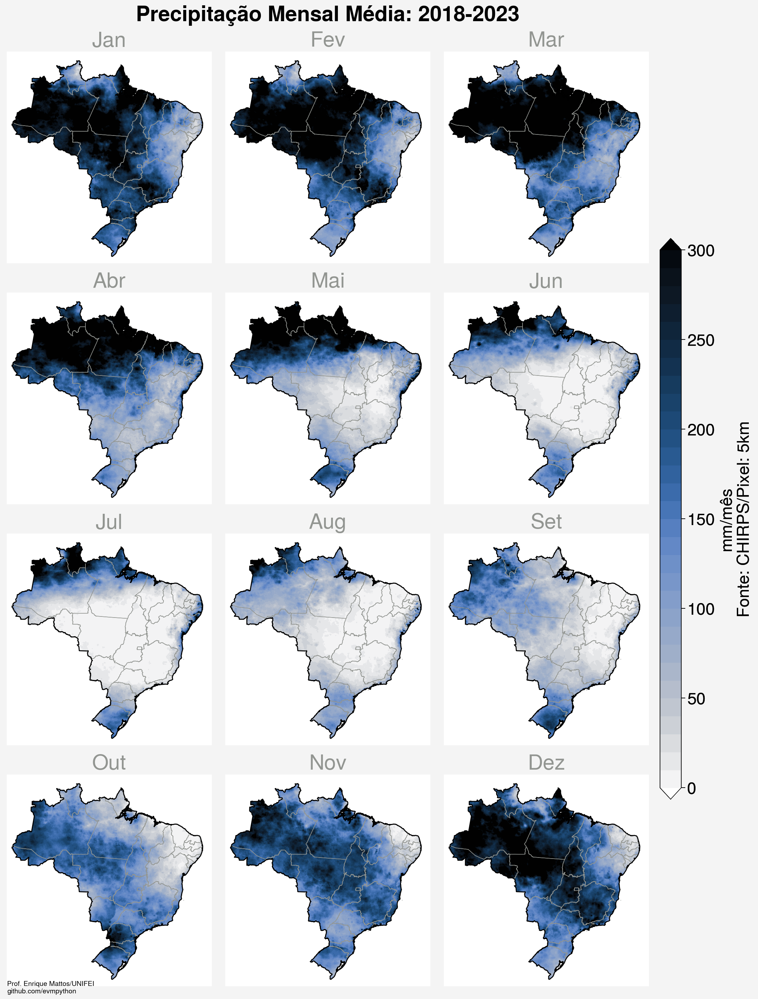

In [47]:
# cria a moldura da figura
fig, ax = pplt.subplots(ncols=3, nrows=4, axheight=3, tight=True, proj='pcarree', sharex=True, sharey=True)

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          labels=False,
          latlim=(latmin-0.10, latmax+0.10), lonlim=(lonmin-0.10, lonmax+0.10),
          suptitle=f'Precipitação Mensal Média: {anoi}-{anof}',
          small='25px', large='30px',
          linewidth=0, grid=False)

# nome do mês
nome_mes =  ['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 'Jul', 'Aug', 'Set', 'Out', 'Nov', 'Dez']

# loop dos meses
for m in np.arange(0, 12):

    # nome do mês
    mes = str(m+1).zfill(2)

    # plota figura
    if m == 0:
        map1 = ax[m].contourf(chuva_media_mensal['longitude'],
                              chuva_media_mensal['latitude'],
                              chuva_media_mensal[m,:,:],
                              cmap='oslo_r',
                              vmin=0, vmax=300,
                              levels=pplt.arange(0, 300, 10),
                              extend='both')
    else:
        ax[m].contourf(chuva_media_mensal['longitude'],
                       chuva_media_mensal['latitude'],
                       chuva_media_mensal[m,:,:],
                       cmap='oslo_r',
                       vmin=0, vmax=300,
                       levels=pplt.arange(0, 300, 10),
                       extend='both')

    # plota titulo de cada figura
    if (m==1 or m==2 or m==4 or m==5 or m==7 or m==8): ax[m].format(title = nome_mes[m], titleloc='c', titlecolor='grey')
    if (m==10 or m==11): ax[m].format(title = nome_mes[m], titleloc='c', titlecolor='grey')
    if (m==0 or m==3 or m==6): ax[m].format(title = nome_mes[m], titleloc='c', titlecolor='grey')
    if (m==9): ax[m].format(title = nome_mes[m], titleloc='c', titlecolor='grey')

    # plota contornos
    if roi == 'brasil':
        # plota contorno dos Estados
        estados_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/estados_do_brasil/BR_UF_2019.shp')
        estados_brasil.plot(edgecolor='gray', facecolor='none', linewidth=0.5, alpha=1, ax=ax[m])

        # plota contorno do Brasil
        contorno_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/brasil/BRAZIL.shp')
        contorno_brasil.plot(edgecolor='black', facecolor='none', linewidth=1.0, alpha=1, ax=ax[m])
    else:
        # plota contorno do Estado
        shp.plot(edgecolor='black', facecolor='none', linewidth=1.2, alpha=1, ax=ax[m])


# informação na figura
ax[9].annotate('Prof. Enrique Mattos/UNIFEI\ngithub.com/evmpython', xy=(lonmin, latmin-1.5), fontsize=7, color='black')

# plota barra de cores da figura
fig.colorbar(map1, loc='r', orientation='vertical', label='mm/mês\nFonte: CHIRPS/Pixel: 5km', ticks=50, ticklabelsize=17, labelsize=17, space=0.5, length=0.60, width=0.3)

# salva figura
fig.savefig(f'Fig_7_chirps_media_mensal_{anoi}_{anof}.jpg', dpi=300)

# **PARTE 8)**:  Comparação da precipitação mensal `CHIRPS` e `MERGE`

##Define o ano e mês

In [48]:
# define mês e ano
ano, mes = '2024', '02'

# nome do mês
nome_mes =  ['Janeiro', 'Fevereio', 'Março', 'Abril', 'Maio', 'Junho', 'Julho', 'Augosto', 'Setembro', 'Outubro', 'Novembro', 'Dezembro']

# Selecina a extensão da imagem [min. lon, min. lat, max. lon, max. lat]
extent = [lonmin, latmin, lonmax, latmax]

##Carrega os dados do `CHIRPS`:

In [49]:
%%time
# carrega os dados do CHIRPS
chuva_chirps = xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')\
                 .sel(time=slice(f'{ano}-{mes}', f'{ano}-{mes}'))\
                 .sel(longitude=slice(lonmin, lonmax), latitude=slice(latmin, latmax))

# mostra os dados
chuva_chirps

CPU times: user 67.1 ms, sys: 5.75 ms, total: 72.9 ms
Wall time: 2.99 s


<xarray.Dataset>
Dimensions:    (time: 1, latitude: 840, longitude: 840)
Coordinates:
  * time       (time) datetime64[ns] 2024-02-01
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
Data variables:
    precip     (time, latitude, longitude) float32 ...
Attributes: (12/31)
    acknowledgements:          The Climate Hazards Group InfraRed Precipitati...
    cdm_data_type:             Grid
    Conventions:               CF-1.6, COARDS, ACDD-1.3
    creator_email:             pete@geog.ucsb.edu
    creator_name:              Pete Peterson
    creator_type:              person
    ...                        ...
    summary:                   This dataset has monthly averages of the Clima...
    time_coverage_end:         2024-02-01T00:00:00Z
    time_coverage_start:       1981-01-01T00:00:00Z
    title:                     CHIRPS Version 2.0, Precipitation, Global, 0.0...
    version:                   2.0
    Westernmost_Easting:       -179.975

In [50]:
xr.open_dataset('https://coastwatch.pfeg.noaa.gov/erddap/griddap/chirps20GlobalMonthlyP05')

<xarray.Dataset>
Dimensions:    (time: 518, latitude: 2000, longitude: 7200)
Coordinates:
  * time       (time) datetime64[ns] 1981-01-01 1981-02-01 ... 2024-02-01
  * latitude   (latitude) float32 -49.97 -49.92 -49.88 ... 49.87 49.92 49.97
  * longitude  (longitude) float32 -180.0 -179.9 -179.9 ... 179.9 179.9 180.0
Data variables:
    precip     (time, latitude, longitude) float32 ...
Attributes: (12/31)
    acknowledgements:          The Climate Hazards Group InfraRed Precipitati...
    cdm_data_type:             Grid
    Conventions:               CF-1.6, COARDS, ACDD-1.3
    creator_email:             pete@geog.ucsb.edu
    creator_name:              Pete Peterson
    creator_type:              person
    ...                        ...
    summary:                   This dataset has monthly averages of the Clima...
    time_coverage_end:         2024-02-01T00:00:00Z
    time_coverage_start:       1981-01-01T00:00:00Z
    title:                     CHIRPS Version 2.0, Precipitation, Global, 0.0...
    version:                   2.0
    Westernmost_Easting:       -179.975

##Carrega os dados do `MERGE`:

Baixa os dados diários do MERGE

In [51]:
%%time
import calendar

# ano, mês e dia INICIAL do período
anoi = int(ano)
mesi = int(mes)
diai = 1

# ano, mês e dia FINAL do período
anof = int(ano)
mesf = int(mes)
diaf = calendar.monthrange(anof, mesf)[1]

# FTP dos dados por dia
ftp = 'http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/'

# Data desejada
date_in = datetime(anoi, mesi, diai)
date_ini = date_in.strftime('%Y%m%d')

date_en = datetime(anof, mesf, diaf)
date_end = date_en.strftime('%Y%m%d')

# Número de dias
n_days = date_en - date_in

# Download dos dados
for file in pd.date_range(date_ini, date_end, freq='d'):

    # extrai ano e mes
    ano = file.strftime('%Y')
    mes = file.strftime('%m')
    dia = file.strftime('%d')

    # nome do arquivo
    filename = f'MERGE_CPTEC_{ano}{mes}{dia}.grib2'

    # ftp + filename. Exemplo: http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/2023/09/MERGE_CPTEC_20230920.grib2
    ftp_filename = f'{ftp}{ano}/{mes.zfill(2)}/{filename}'

    # baixando arquivo diário de chuva
    !wget {ftp_filename}

    print('\n---------------------')
    print('Downloading FTP File:')
    print('---------------------')
    print('Model: MERGE')
    print('File Name: ' + ftp_filename)

--2024-04-13 21:28:13--  http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/2024/02/MERGE_CPTEC_20240201.grib2
Resolving ftp.cptec.inpe.br (ftp.cptec.inpe.br)... 150.163.192.38
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.192.38|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 312919 (306K)
Saving to: ‘MERGE_CPTEC_20240201.grib2’

MERGE_CPTEC_2024020 100%[===================>] 305.58K   365KB/s    in 0.8s    

2024-04-13 21:28:15 (365 KB/s) - ‘MERGE_CPTEC_20240201.grib2’ saved [312919/312919]


---------------------
---------------------
Model: MERGE
File Name: http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/2024/02/MERGE_CPTEC_20240201.grib2
--2024-04-13 21:28:15--  http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/2024/02/MERGE_CPTEC_20240202.grib2
Resolving ftp.cptec.inpe.br (ftp.cptec.inpe.br)... 150.163.192.38
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.192.38|:80... connected.
HTTP request sent, awaiting respo

Soma a chuva do MERGE

In [52]:
%%time
# Loop nos arquivos diários. date_ini='20231201' e date_end='20231231'
for data in pd.date_range(date_ini, date_end, freq='d'):

    # Extrai no formato '2021-10-17 00:00:00' para '20211017'
    ano_mes_dia = data.strftime('%Y%m%d')

    # Monta o nome do arquivo 'MERGE_CPTEC_20211001.grib2'
    file_name = f'MERGE_CPTEC_{str(ano_mes_dia)}.grib2'

    # Monta o caminho e nome do arquivo '/content/input/MERGE_CPTEC_20211017.grib2'
    grib = f'/content/{file_name}'

    # Se o arquivo existe
    if (os.path.exists(grib)):

        # imprimindo na tela o arquivo atual
        print('Processando arquivo:', grib)

        # Lendo o arquivo
        grib = pygrib.open(grib)

        # Lendo o campo do modelo
        grb = grib.select(name='Precipitation')[0]

        # Extrai os dados para uma área específica
        precip, lats, lons = grb.data(lat1=extent[1],lat2=extent[3],lon1=extent[0]+360,lon2=extent[2]+360)

        # Converter de 'kg m**-2 s**-1' para 'mm/h'
        #precip = precip * 60 * 60

        # Suaviza os contornos
        #precip = scipy.ndimage.zoom(precip, 3)
        #lons = scipy.ndimage.zoom(lons, 3)
        #lats = scipy.ndimage.zoom(lats, 3)

        # Se é o primeiro ciclo, cria um array que guardará os valores médios
        if (ano_mes_dia == date_ini):
            precip_sum = np.zeros( (precip.shape[0], precip.shape[1]) )
            precip_max = np.full((precip.shape[0], precip.shape[1]), -9999)
            precip_min = np.full((precip.shape[0], precip.shape[1]),  9999)

        # Soma os valores
        precip_sum = precip_sum + precip

        # Extrai o valor máximo
        precip_max = np.maximum(precip, precip_max)

        # Extrai o valor mínimo
        precip_min = np.minimum(precip, precip_min)

# Calcula o valor médio
precip_med = precip_sum / n_days.days

# colocar chuva abaixo de 1 mm/h como "Not a Number"
precip_min[precip_min < 1] = np.nan
precip_max[precip_max < 1] = np.nan
precip_med[precip_med < 1] = np.nan
precip_sum[precip_sum < 1] = np.nan

Processando arquivo: /content/MERGE_CPTEC_20240201.grib2
Processando arquivo: /content/MERGE_CPTEC_20240202.grib2
Processando arquivo: /content/MERGE_CPTEC_20240203.grib2
Processando arquivo: /content/MERGE_CPTEC_20240204.grib2
Processando arquivo: /content/MERGE_CPTEC_20240205.grib2
Processando arquivo: /content/MERGE_CPTEC_20240206.grib2
Processando arquivo: /content/MERGE_CPTEC_20240207.grib2
Processando arquivo: /content/MERGE_CPTEC_20240208.grib2
Processando arquivo: /content/MERGE_CPTEC_20240209.grib2
Processando arquivo: /content/MERGE_CPTEC_20240210.grib2
Processando arquivo: /content/MERGE_CPTEC_20240211.grib2
Processando arquivo: /content/MERGE_CPTEC_20240212.grib2
Processando arquivo: /content/MERGE_CPTEC_20240213.grib2
Processando arquivo: /content/MERGE_CPTEC_20240214.grib2
Processando arquivo: /content/MERGE_CPTEC_20240215.grib2
Processando arquivo: /content/MERGE_CPTEC_20240216.grib2
Processando arquivo: /content/MERGE_CPTEC_20240217.grib2
Processando arquivo: /content/M

Transforma a matriz para DataSet

In [53]:
# quantidade de colunas e linhas da matriz
nx, ny = precip_sum.shape[1], precip_sum.shape[0]

# define a matriz de latitude e longitude
lats2 = lats[:,0]
lons2 = ((lons[0,:] + 180) % 360) - 180 # transforma as longitudes de 0/360 para -180/180

# gerando dataset em formato netcdf
data_vars = {'rain':(('lat', 'lon'), precip_sum, {'units': 'mm/mês', 'long_name':'precipitação mensal do MERGE'})}
coords = {'lat': lats2, 'lon': lons2}
chuva_merge = xr.Dataset(data_vars=data_vars, coords=coords)

# salva arquivo NETCDF
chuva_merge.to_netcdf(f'/content/MERGE_CPTEC_{ano}{mes}.nc')

##Plota figura

In [54]:
# mostra os dados do CHIRPS
chuva_chirps

<xarray.Dataset>
Dimensions:    (time: 1, latitude: 840, longitude: 840)
Coordinates:
  * time       (time) datetime64[ns] 2024-02-01
  * latitude   (latitude) float32 -34.97 -34.92 -34.88 ... 6.875 6.925 6.975
  * longitude  (longitude) float32 -74.98 -74.93 -74.88 ... -33.12 -33.07 -33.03
Data variables:
    precip     (time, latitude, longitude) float32 ...
Attributes: (12/31)
    acknowledgements:          The Climate Hazards Group InfraRed Precipitati...
    cdm_data_type:             Grid
    Conventions:               CF-1.6, COARDS, ACDD-1.3
    creator_email:             pete@geog.ucsb.edu
    creator_name:              Pete Peterson
    creator_type:              person
    ...                        ...
    summary:                   This dataset has monthly averages of the Clima...
    time_coverage_end:         2024-02-01T00:00:00Z
    time_coverage_start:       1981-01-01T00:00:00Z
    title:                     CHIRPS Version 2.0, Precipitation, Global, 0.0...
    version:                   2.0
    Westernmost_Easting:       -179.975

In [55]:
# mostra os dados do MERGE
chuva_merge

<xarray.Dataset>
Dimensions:  (lat: 420, lon: 420)
Coordinates:
  * lat      (lat) float64 -34.95 -34.85 -34.75 -34.65 ... 6.65 6.75 6.85 6.95
  * lon      (lon) float64 -74.95 -74.85 -74.75 -74.65 ... -33.25 -33.15 -33.05
Data variables:
    rain     (lat, lon) float64 24.0 26.0 25.88 23.06 ... 4.75 4.0 3.625 4.0

CPU times: user 20.3 s, sys: 1.93 s, total: 22.3 s
Wall time: 24.2 s


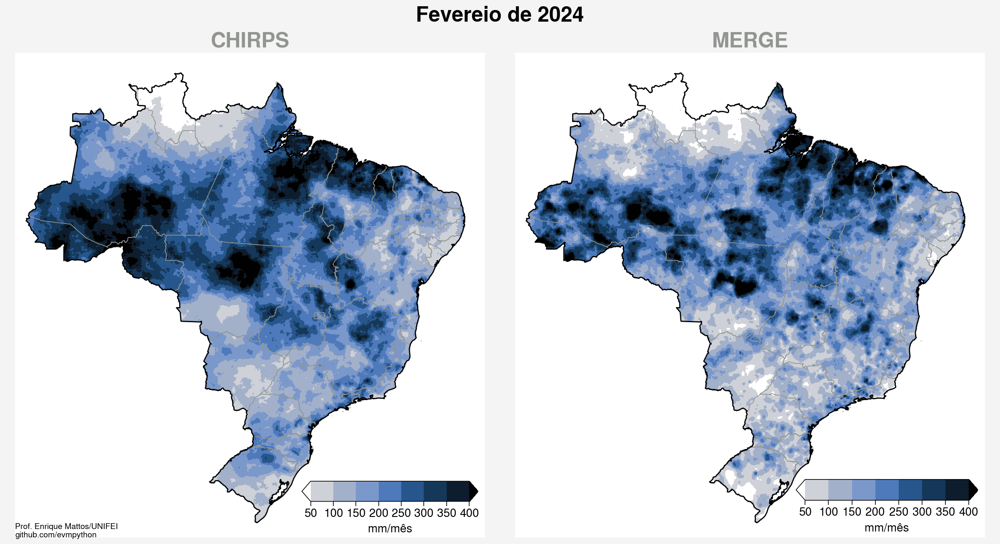

In [56]:
%%time
#========================================================================================================================#
#                                           PLOTA FIGURA
#========================================================================================================================#
# cria a moldura da figura
fig, ax = pplt.subplots(axwidth=6, ncols=2, nrows=1, tight=True, proj='pcarree')

# define formato da figura
ax.format(coast=False, borders=False, innerborders=False,
          labels=False, latlines=5, lonlines=10,
          latlim=(latmin, latmax), lonlim=(lonmin, lonmax),
          small='20px', large='25px',
          linewidth=0, grid=False,
          suptitle=f'{nome_mes[int(mes)-1]} de {ano}')

#--------------------------------------------------------------#
#                            FIG-1
#--------------------------------------------------------------#
# plota mapa
map1 = ax[0].contourf(chuva_chirps['longitude'],
                      chuva_chirps['latitude'],
                      chuva_chirps['precip'][0,:,:].salem.roi(shape=shp),
                      cmap='oslo_r',
                      vmin=50, vmax=400,
                      levels=pplt.arange(50, 400, 50),
                      extend='both',
                      colorbar='best',
                      colorbar_kw={'label': 'mm/mês',
                                   'length': 18,
                                   'frameon': False,
                                   'ticklabelsize': 10,
                                   'labelsize': 10,
                                   'width': 2,
                                   'ticks': 50})

# título da figura
ax[0].format(title=f'CHIRPS',
             titleloc='c',
             titleweight='bold',
             titlecolor='grey')

# plota contorno dos Estados
estados_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/estados_do_brasil/BR_UF_2019.shp')
estados_brasil.plot(edgecolor='gray', facecolor='none', linewidth=0.5, alpha=1, ax=ax[0])

# plota contorno do Brasil
contorno_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/brasil/BRAZIL.shp')
contorno_brasil.plot(edgecolor='black', facecolor='none', linewidth=1.0, alpha=1, ax=ax[0])

# informação na figura
ax[0].annotate('Prof. Enrique Mattos/UNIFEI\ngithub.com/evmpython', xy=(lonmin,latmin), fontsize=7, color='black')

#--------------------------------------------------------------#
#                            FIG-2
#--------------------------------------------------------------#
ax[1].contourf(chuva_merge['lon'],
               chuva_merge['lat'],
               chuva_merge['rain'][:,:].salem.roi(shape=shp),
               cmap='oslo_r',
               vmin=50, vmax=400,
               levels=pplt.arange(50, 400, 50),
               extend='both',
               colorbar='best',
               colorbar_kw={'label': 'mm/mês',
                            'length': 18,
                            'frameon': False,
                            'ticklabelsize': 10,
                            'labelsize': 10,
                            'width': 2,
                            'ticks': 50})

# título da figura
ax[1].format(title=f'MERGE',
             titleloc='c',
             titleweight='bold',
             titlecolor='grey')

# plota contorno dos Estados
estados_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/estados_do_brasil/BR_UF_2019.shp')
estados_brasil.plot(edgecolor='gray', facecolor='none', linewidth=0.5, alpha=1, ax=ax[1])

# plota contorno do Brasil
contorno_brasil = salem.read_shapefile('https://github.com/evmpython/shapefile/raw/main/brasil/BRAZIL.shp')
contorno_brasil.plot(edgecolor='black', facecolor='none', linewidth=1.0, alpha=1, ax=ax[1])

# salva figura
fig.save(f'Fig_8_chirps_merge_mensal_{ano}{mes}.jpg', dpi=300)